In [1]:
import IPython.display as ipd
ipd.Audio('C:/Users/user/Desktop/dlex/Karissa_Hobbs_-_09_-_Lets_Go_Fishin.mp3')

In [3]:
import os
import pandas as pd
import librosa
import glob 
import matplotlib.pyplot as plt
import librosa.display
import numpy as np
%matplotlib inline
plt.style.use('ggplot')

In [4]:
data, sampling_rate = librosa.load('C:/Users/user/Desktop/dlex/Karissa_Hobbs_-_09_-_Lets_Go_Fishin.mp3')

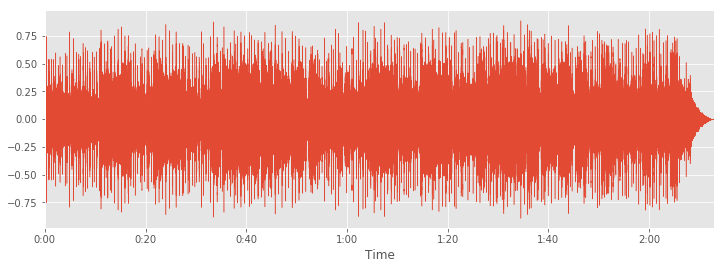

In [5]:
plt.figure(figsize=(12, 4))
librosa.display.waveplot(data, sr=sampling_rate)

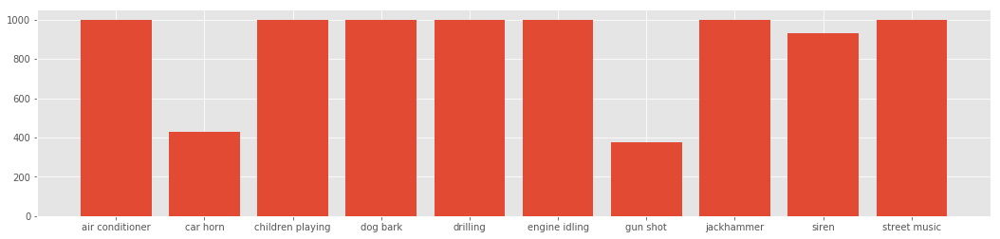

In [6]:
def get_labels(parent_dir,sub_dirs,file_ext='*.wav'):
    labels = np.empty(0)
    for label, sub_dir in enumerate(sub_dirs):
        for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
            try:
                class_value = fn.split('fold')[1].split('-')[1]
                labels = np.append(labels, class_value)
            except:
                print("Error processing " + fn + " - skipping")
    return labels

# put the path to the downloaded UrbanSound8K files here
raw_data_dir = 'G:/UrbanSound8k/audio'
subsequent_fold = False
for k in range(1,11):
    fold_name = 'fold' + str(k)
    labels = get_labels(raw_data_dir, [fold_name])
    if subsequent_fold:
        all_labels = np.concatenate((all_labels, labels))
    else:
        all_labels = labels
        subsequent_fold = True
    
unique, counts = np.unique(all_labels, return_counts=True)
sound_names = ["air conditioner","car horn","children playing","dog bark","drilling","engine idling",
               "gun shot","jackhammer","siren","street music"]

plt.figure(figsize=(18,4))
plt.bar(np.arange(len(unique)), counts, align='center')
plt.xticks(np.arange(len(unique)), sound_names)
plt.show()

In [7]:
def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load('G:/UrbanSound8K/audio/'+fp)
        raw_sounds.append(X)
    return raw_sounds

In [8]:
def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,10), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 1: Waveplot',x=0.5, y=0.95,fontsize=18)
    plt.show()
    
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,10), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        plt.specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 2: Spectrogram',x=0.5, y=0.95,fontsize=18)
    plt.show()

def plot_log_power_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,10), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(2,5,i)
        D = librosa.amplitude_to_db(np.abs(librosa.stft(f)), ref=np.max)
        #D = librosa.logamplitude(np.abs(librosa.stft(f))**2, ref_power=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 3: Log power spectrogram',x=0.5, y=0.95,fontsize=18)
    plt.show()

In [9]:
sound_file_paths = ["fold1/57320-0-0-7.wav","fold2/4201-3-0-0.wav","fold3/6988-5-0-0.wav","fold4/344-3-0-0.wav",
"fold5/6508-9-0-1.wav","fold6/4910-3-0-0.wav","fold7/518-4-0-0.wav",
"fold8/4918-3-0-0.wav","fold9/7063-6-0-0.wav","fold10/2937-1-0-0.wav"]

sound_names = ["air conditioner","car horn","children playing",
"dog bark","drilling","engine idling", "gun shot",
"jackhammer","siren","street music"]

raw_sounds = load_sound_files(sound_file_paths)

plot_waves(sound_names,raw_sounds)

In [10]:
plot_specgram(sound_names,raw_sounds)

C:\Users\user\Anaconda3\lib\site-packages\matplotlib\axes\_axes.py:7609: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


In [11]:
plot_log_power_specgram(sound_names,raw_sounds)

In [1]:
import pandas as pd
import os
import librosa
import librosa.display
import numpy as np

In [2]:
import struct

class WavFileHelper():
    
    def read_file_properties(self, filename):

        wave_file = open(filename,"rb")
        
        riff = wave_file.read(12)
        fmt = wave_file.read(36)
        
        num_channels_string = fmt[10:12]
        num_channels = struct.unpack('<H', num_channels_string)[0]

        sample_rate_string = fmt[12:16]
        sample_rate = struct.unpack("<I",sample_rate_string)[0]
        
        bit_depth_string = fmt[22:24]
        bit_depth = struct.unpack("<H",bit_depth_string)[0]

        return (num_channels, sample_rate, bit_depth)

In [6]:
#from Documents.helpers.wavfilehelper import WavFileHelper
wavfilehelper = WavFileHelper()

fulldatasetpath = 'C:/Users/lenovo/UrbanSound8K'

metadata = pd.read_csv(fulldatasetpath + '/metadata/UrbanSound8K.csv')

audiodata = []
for index, row in metadata.iterrows():
    
    file_name = os.path.join(os.path.abspath(fulldatasetpath),'fold'+str(row["fold"])+'/',str(row["slice_file_name"]))
    data = wavfilehelper.read_file_properties(file_name)
    audiodata.append(data)

# Convert into a Panda dataframe
audiodf = pd.DataFrame(audiodata, columns=['num_channels','sample_rate','bit_depth'])

In [15]:
#Function that extracts only mfccs
'''def extract_features(file_name):
   
    try:
        audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') 
        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)
        mfccsscaled = np.mean(mfccs.T,axis=0)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file)
        return None 
     
    return mfccsscaled'''

'def extract_features(file_name):\n   \n    try:\n        audio, sample_rate = librosa.load(file_name, res_type=\'kaiser_fast\') \n        mfccs = librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40)\n        mfccsscaled = np.mean(mfccs.T,axis=0)\n        \n    except Exception as e:\n        print("Error encountered while parsing file: ", file)\n        return None \n     \n    return mfccsscaled'

In [7]:
def extract_features(file_name):
   
    try:
        audio, sample_rate = librosa.load(file_name, res_type='kaiser_fast') # default is Kaiser_best
        #mfccs =np.mean(librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40).T,axis=0)
        #print(mfccsscaled)
        stft = np.abs(librosa.stft(audio))
        mfccs = np.mean(librosa.feature.mfcc(y=audio, sr=sample_rate, n_mfcc=40).T,axis=0)
        chroma = np.mean(librosa.feature.chroma_stft(S=stft, sr=sample_rate).T,axis=0)
        mel = np.mean(librosa.feature.melspectrogram(audio, sr=sample_rate).T,axis=0)
        contrast = np.mean(librosa.feature.spectral_contrast(S=stft, sr=sample_rate).T,axis=0)
        tonnetz = np.mean(librosa.feature.tonnetz(y=librosa.effects.harmonic(audio),
        sr=sample_rate).T,axis=0)
        
    except Exception as e:
        print("Error encountered while parsing file: ", file_name)
        return None 
     
    return mfccs,chroma,mel,contrast,tonnetz



In [9]:
import pandas as pd
import os
import librosa
import timeit
import csv

# Set the path to the full UrbanSound dataset 
fulldatasetpath = 'C:/Users/lenovo/UrbanSound8K'

metadata = pd.read_csv(fulldatasetpath + '/metadata/UrbanSound8K.csv')

features = []

# Iterate through each sound file and extract the features 
# measure the time taken to extract features
start = timeit.timeit()
with open("C:/Users/lenovo/Desktop/csvfile.csv", 'w', newline='') as f:
    writer = csv.writer(f)
        
    for index, row in metadata.iterrows():

        file_name = os.path.join(os.path.abspath(fulldatasetpath),'fold'+str(row["fold"])+'/',str(row["slice_file_name"]))

        class_label = row["class"]

        mfccs, chroma, mel, contrast, tonnetz = extract_features(file_name)

        features.append([mfccs, chroma, mel, contrast, tonnetz, class_label])
        
        writer.writerow((mfccs, chroma, mel, contrast, tonnetz, class_label))

# Convert into a Panda dataframe 
featuresdf = pd.DataFrame(features, columns=['mfccs','chroma','mel','contrast','tonnetz','class_label'])
end = timeit.timeit()
print("Time taken to extract features : ",end-start)
print('Finished feature extraction from ', len(featuresdf), ' files')

C:\Users\lenovo\Miniconda3\envs\tensorflow\lib\site-packages\librosa\core\pitch.py:146: UserWarning: Trying to estimate tuning from empty frequency set.
  warnings.warn('Trying to estimate tuning from empty frequency set.')
C:\Users\lenovo\Miniconda3\envs\tensorflow\lib\site-packages\librosa\util\utils.py:1480: RuntimeWarning: invalid value encountered in less
  if np.any(X < 0) or np.any(X_ref < 0):
C:\Users\lenovo\Miniconda3\envs\tensorflow\lib\site-packages\librosa\util\utils.py:1493: RuntimeWarning: invalid value encountered in less
  bad_idx = (Z < np.finfo(dtype).tiny)


Error encountered while parsing file:  C:\Users\lenovo\UrbanSound8K\fold2/17307-1-0-0.wav


TypeError: 'NoneType' object is not iterable

In [10]:
featuresdf = pd.DataFrame(features, columns=['mfccs','chroma','mel','contrast','tonnetz','class_label'])

In [11]:
print( "MFCSS  = ", len(mfccs))
print("Chroma = ", len(chroma))
print("Mel = ", len(mel))
print("Contrast = ", len(contrast))
print("Tonnetz = ", len(tonnetz))
#print(type(features[0]))
#print(featuresdf)

MFCSS  =  40
Chroma =  12
Mel =  128
Contrast =  7
Tonnetz =  6


In [12]:
from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Convert features and corresponding classification labels into numpy arrays
only_features=np.concatenate((featuresdf.mfccs.tolist(),featuresdf.chroma.tolist(),featuresdf.mel.tolist(),featuresdf.contrast.tolist(),featuresdf.tonnetz.tolist()),axis=1)
X = np.array(only_features)
y = np.array(featuresdf.class_label.tolist())

# Encode the classification labels
le = LabelEncoder()
yy = to_categorical(le.fit_transform(y)) 

# split the dataset 
from sklearn.model_selection import train_test_split 

train_x, test_x, train_y, test_y = train_test_split(X, yy, test_size=0.2, random_state = 42)

Using TensorFlow backend.


In [13]:
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Dropout,Convolution2D, MaxPooling2D
from keras.optimizers import Adam
from keras.callbacks import EarlyStopping
from keras.models import model_from_json

In [14]:
# neural network dimensions
n_dim = train_x.shape[1]
n_classes = train_y.shape[1]
n_hidden_units_1 = n_dim
n_hidden_units_2 = 400 # approx n_dim * 2
n_hidden_units_3 = 200 # half of layer 2

In [15]:
print(n_dim)
print("Features: {} Classes: {} ".format(n_dim, n_classes))

193
Features: 193 Classes: 10 


In [16]:
def create_model(activation_function='relu',init_type='normal', kernel_initializer="uniform", optimiser='Adamax', dropout_rate=0.5):
    model = Sequential()
    # layer 1
    #model.add(Convolution2D(n_hidden_units_1, input_dim=n_dim, activation=activation_function,kernel_initializer="uniform"))
    #model.add(MaxPooling2D(2,2))
    model.add(Dense(n_hidden_units_1, input_dim=n_dim, init=init_type, activation=activation_function))
    # layer 2
    model.add(Dense(n_hidden_units_2, kernel_initializer="uniform", activation=activation_function))
    model.add(Dropout(dropout_rate))
    # layer 3
    model.add(Dense(n_hidden_units_3, kernel_initializer="uniform" , activation=activation_function))
    model.add(Dropout(dropout_rate))
    # output layer
    model.add(Dense(n_classes, kernel_initializer="uniform", activation='softmax'))
    
    model.compile(loss='categorical_crossentropy', optimizer=optimiser, metrics=['accuracy'])
    return model

In [17]:
model = create_model()
earlystop = EarlyStopping(monitor='val_loss', patience=3, verbose=0, mode='auto')


C:\Users\lenovo\Miniconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:6: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(193, input_dim=193, activation="relu", kernel_initializer="normal")`
  


In [18]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 193)               37442     
_________________________________________________________________
dense_2 (Dense)              (None, 400)               77600     
_________________________________________________________________
dropout_1 (Dropout)          (None, 400)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 200)               80200     
_________________________________________________________________
dropout_2 (Dropout)          (None, 200)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 10)                2010      
Total params: 197,252
Trainable params: 197,252
Non-trainable params: 0
________________________________________________

In [19]:
history = model.fit(train_x, train_y, epochs=30, validation_split=0.1, callbacks=[earlystop], batch_size=24)

Train on 2559 samples, validate on 285 samples
Epoch 1/30
2559/2559 [==============================] - 2s 794us/step - loss: 1.9326 - acc: 0.3185 - val_loss: 1.3813 - val_acc: 0.5649
Epoch 2/30
2559/2559 [==============================] - 1s 286us/step - loss: 1.4173 - acc: 0.5018 - val_loss: 1.0974 - val_acc: 0.6561
Epoch 3/30
2559/2559 [==============================] - 1s 301us/step - loss: 1.2149 - acc: 0.5862 - val_loss: 0.9205 - val_acc: 0.7368
Epoch 4/30
2559/2559 [==============================] - 1s 289us/step - loss: 1.0334 - acc: 0.6581 - val_loss: 0.8219 - val_acc: 0.7509
Epoch 5/30
2559/2559 [==============================] - 1s 357us/step - loss: 0.9005 - acc: 0.7038 - val_loss: 0.6992 - val_acc: 0.7789
Epoch 6/30
2559/2559 [==============================] - 1s 331us/step - loss: 0.7485 - acc: 0.7667 - val_loss: 0.6264 - val_acc: 0.8140
Epoch 7/30
2559/2559 [==============================] - 1s 376us/step - loss: 0.6781 - acc: 0.7902 - val_loss: 0.5970 - val_acc: 0.8140
E

In [20]:
score, accuracy = model.evaluate(x = test_x, y = test_y , verbose = 1)

711/711 [==============================] - 0s 59us/step


In [21]:
print(accuracy, score)

0.9268635724331927 0.2734966087672446


In [22]:
model_json=model.to_json()
with open("model.json",'w') as json_file:
    json_file.write(model_json)
model.save_weights("model.h5")
print("saved model to disk")

saved model to disk


In [24]:
json_file=open("model.json",'r')
loaded_model_json=json_file.read()
json_file.close()
loaded_model=model_from_json(loaded_model_json)
loaded_model.load_weights("model.h5")
print("loaded model from disk")


loaded model from disk


In [25]:
loaded_model.compile(loss='categorical_crossentropy', optimizer='Adamax',metrics=['accuracy'])

In [26]:
score, accuracy = model.evaluate(x = test_x, y = test_y , verbose = 1)
print(accuracy, score)

711/711 [==============================] - 0s 167us/step
0.9268635724331927 0.2734966087672446
